### Notebook for the analysis of ATAC-Seq data from the `KMD6A` group using `SCENIC+`

- **Developed by:** Carlos Talavera-López Ph.D
- **Würzburg Institute for Systems Immunology - Faculty of Medicine - Julius-Maximilian-Universität Würzburg**
- v240116

### Import required modules

In [1]:
import os
import sys
import dill
import pickle
import anndata
import warnings
import pycisTopic
import numpy as np
import scanpy as sc
import pandas as pd
import plotnine as p
import pyranges as pr
import seaborn as sns
import pybiomart as pbm
from pywaffle import Waffle
import matplotlib.pyplot as plt

from pycisTopic.qc import *
from scenicplus.RSS import *
from pycisTopic.clust_vis import *
from pycisTopic.lda_models import *
from pycisTopic.diff_features import *
from pycisTopic.cistopic_class import *
from pycisTopic.topic_binarization import *
from pycisTopic.iterative_peak_calling import *
from scenicplus.plotting.correlation_plot import *
from scenicplus.plotting.dotplot import heatmap_dotplot
from pycistarget.utils import region_names_to_coordinates
from scenicplus.eregulon_enrichment import score_eRegulons
from pycisTopic.pseudobulk_peak_calling import peak_calling
from scenicplus.wrappers.run_scenicplus import run_scenicplus
from scenicplus.dimensionality_reduction import plot_eRegulon
from scenicplus.wrappers.run_pycistarget import run_pycistarget
from scenicplus.scenicplus_class import create_SCENICPLUS_object
from scenicplus.dimensionality_reduction import plot_AUC_given_ax
from pycisTopic.diff_features import find_highly_variable_features
from scenicplus.dimensionality_reduction import plot_metadata_given_ax
from scenicplus.cistromes import TF_cistrome_correlation, generate_pseudobulks
from scenicplus.preprocessing.filtering import apply_std_filtering_to_eRegulons
from scenicplus.dimensionality_reduction import run_eRegulons_tsne, run_eRegulons_umap
from scenicplus.networks import create_nx_tables, create_nx_graph, plot_networkx, export_to_cytoscape

/home/ruth/mambaforge/envs/scenic+/lib/python3.10/site-packages/loompy/bus_file.py:68: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/home/ruth/mambaforge/envs/scenic+/lib/python3.10/site-packages/loompy/bus_file.py:85: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/home/ruth/mambaforge/envs/scenic+/lib/python3.10/site-packages/loompy/bus_file.py:102: NumbaDeprecati

### Set up working environment

In [2]:
%matplotlib inline
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.4
scanpy      1.9.6
-----
PIL                         10.2.0
adjustText                  1.0.4
appdirs                     1.4.4
asttokens                   NA
attr                        23.2.0
attrs                       23.2.0
bidict                      0.22.1
bioservices                 1.11.2
boltons                     NA
bs4                         4.12.2
cattr                       NA
cattrs                      NA
certifi                     2023.11.17
cffi                        1.16.0
charset_normalizer          3.3.2
cloudpickle                 3.0.0
colorama                    0.4.6
colorlog                    NA
comm                        0.2.1
ctxcore                     0.2.0
cycler                      0.12.1
cython_runtime              NA
cytoolz                     0.12.2
dask                        2024.1.0
dateutil                    2.8.2
debugpy                     1.8.0
decorator                   5.1.1
defusedxml                  0.7.1


In [3]:
_stderr = sys.stderr
null = open(os.devnull,'wb')
warnings.simplefilter(action = 'ignore')
%config InlineBackend.figure_format = 'retina'
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}

In [4]:
macs_path = 'macs2'
work_dir = '../data/'
save_dir = '/mnt/LaCIE/carlos/atac_analysis/becker23'
tmp_dir = '/mnt/LaCIE/carlos/INBOX/'

### Read in data

In [5]:
fragments_dict = {'KDM6A_wt_40': os.path.join(work_dir, 'fragments/KDM6A_wt_40_fragments.tsv.gz'), 
                  'KDM6A_wt_11': os.path.join(work_dir, 'fragments/KDM6A_wt_11_fragments.tsv.gz'),
                  'KDM6A_KO_34': os.path.join(work_dir, 'fragments/KDM6A_KO_34_fragments.tsv.gz'),
                  'KDM6A_KO_31': os.path.join(work_dir, 'fragments/KDM6A_KO_31_fragments.tsv.gz'),
                  'GSKJ4_sham_51': os.path.join(work_dir, 'fragments/GSKJ4_sham_51_fragments.tsv.gz'),
                  'GSKJ4_sham_57': os.path.join(work_dir, 'fragments/GSKJ4_sham_57_fragments.tsv.gz'),
                  'GSKJ4_treat_47': os.path.join(work_dir, 'fragments/GSKJ4_treat_47_fragments.tsv.gz'),
                  'GSKJ4_treat_52': os.path.join(work_dir, 'fragments/GSKJ4_treat_52_fragments.tsv.gz')}

### Generate pseudobulk ATAC-seq profiles, call peaks and generate a consensus peak set

In [6]:
heart_gex = sc.read_h5ad('../data/Kdm6aKO_ALL_GEX-CB_scANVI-CellTypes_ctl240117.raw.h5ad') 
heart_gex

AnnData object with n_obs × n_vars = 46136 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'group', 'file', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'gene_ids', 'feature_types', 'genome', 'modality', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap'

In [7]:
cell_data = heart_gex.obs
cell_data['celltype'] = cell_data['C_scANVI'].astype(str)

### Get chromosome sizes for GRCm38

In [8]:
target_url = 'http://hgdownload.cse.ucsc.edu/goldenPath/mm39/bigZips/mm39.chrom.sizes'
chromsizes = pd.read_csv(target_url, sep = '\t', header = None)
chromsizes.columns = ['Chromosome', 'End']
chromsizes['Start'] = [0] * chromsizes.shape[0]
chromsizes = chromsizes.loc[:,['Chromosome', 'Start', 'End']]
chromsizes['Chromosome'] = [chromsizes['Chromosome'][x].replace('v', '.') for x in range(len(chromsizes['Chromosome']))]
chromsizes['Chromosome'] = [chromsizes['Chromosome'][x].split('_')[1] if len(chromsizes['Chromosome'][x].split('_')) > 1 else chromsizes['Chromosome'][x] for x in range(len(chromsizes['Chromosome']))]
chromsizes = pr.PyRanges(chromsizes)
chromsizes

,Chromosome,Start,End
0,GL456210.1,0,169725
1,GL456211.1,0,241735
2,GL456212.1,0,153618
3,GL456219.1,0,175968
4,GL456221.1,0,206961
...,...,...,...
56,chr18,0,90720763
57,chr19,0,61420004
58,chrM,0,16299
59,chrX,0,169476592


In [9]:
from pycisTopic.pseudobulk_peak_calling import export_pseudobulk
bw_paths, bed_paths = export_pseudobulk(input_data = cell_data,
                 variable = 'celltype',                                                                     
                 sample_id_col = 'sample',
                 chromsizes = chromsizes,
                 bed_path = save_dir + '/consensus_peak_calling/pseudobulk_bed_files/',  
                 bigwig_path = save_dir + '/consensus_peak_calling/pseudobulk_bw_files/',
                 path_to_fragments = fragments_dict,                                                        
                 n_cpu = 32,                                                                                
                 normalize_bigwig = True,
                 remove_duplicates = True,
                 split_pattern = '-')

Reading fragments for GSKJ4_treat_52.
from: ../data/fragments/GSKJ4_treat_52_fragments.tsv.gz
Reading fragments for GSKJ4_sham_57.
from: ../data/fragments/GSKJ4_sham_57_fragments.tsv.gz
Reading fragments for KDM6A_KO_31.
from: ../data/fragments/KDM6A_KO_31_fragments.tsv.gz
Reading fragments for GSKJ4_sham_51.
from: ../data/fragments/GSKJ4_sham_51_fragments.tsv.gz
Reading fragments for KDM6A_wt_11.
from: ../data/fragments/KDM6A_wt_11_fragments.tsv.gz
Reading fragments for KDM6A_wt_40.
from: ../data/fragments/KDM6A_wt_40_fragments.tsv.gz
Reading fragments for KDM6A_KO_34.
from: ../data/fragments/KDM6A_KO_34_fragments.tsv.gz
Reading fragments for GSKJ4_treat_47.
from: ../data/fragments/GSKJ4_treat_47_fragments.tsv.gz
2024-01-18 10:29:09,544 cisTopic     INFO     Saving bed and BigWig files.
2024-01-18 10:29:09,545 cisTopic     INFO     Saving EC1_cap.
	BigWig: /mnt/LaCIE/carlos/atac_analysis/becker23/consensus_peak_calling/pseudobulk_bw_files/EC1_cap.bw
	BED: /mnt/LaCIE/carlos/atac_analys

In [10]:
with open(save_dir + '/consensus_peak_calling/pseudobulk_bed_files/bed_paths.pkl', 'wb') as f:
  pickle.dump(bed_paths, f)

In [11]:
with open(save_dir + '/consensus_peak_calling/pseudobulk_bed_files/bw_paths.pkl', 'wb') as f:
  pickle.dump(bw_paths, f)

###  Inferring consensus peaks per pseudobulk profiles

In [12]:
narrow_peaks_dict = peak_calling(macs_path,
                                 bed_paths,
                                 save_dir + '/consensus_peak_calling/MACS/',
                                 genome_size = 'mm',
                                 n_cpu = 32,
                                 input_format = 'BEDPE',
                                 shift = 73,
                                 ext_size = 146,
                                 keep_dup = 'all',
                                 q_value = 0.05,
                                 _temp_dir = os.path.join(tmp_dir, 'ray_spill'))

2024-01-18 11:29:50,410	INFO worker.py:1715 -- Started a local Ray instance. View the dashboard at 127.0.0.1:8265 


(macs_call_peak_ray pid=605215) 2024-01-18 11:29:51,571 cisTopic     INFO     Calling peaks for Adip1 with macs2 callpeak --treatment /mnt/LaCIE/carlos/atac_analysis/becker23/consensus_peak_calling/pseudobulk_bed_files/Adip1.bed.gz --name Adip1  --outdir /mnt/LaCIE/carlos/atac_analysis/becker23/consensus_peak_calling/MACS/ --format BEDPE --gsize mm --qvalue 0.05 --nomodel --shift 73 --extsize 146 --keep-dup all --call-summits --nolambda
(macs_call_peak_ray pid=605215) 2024-01-18 11:29:53,688 cisTopic     INFO     Adip1 done!
(macs_call_peak_ray pid=605232) 2024-01-18 11:29:51,551 cisTopic     INFO     Calling peaks for EC3_cap with macs2 callpeak --treatment /mnt/LaCIE/carlos/atac_analysis/becker23/consensus_peak_calling/pseudobulk_bed_files/EC3_cap.bed.gz --name EC3_cap  --outdir /mnt/LaCIE/carlos/atac_analysis/becker23/consensus_peak_calling/MACS/ --format BEDPE --gsize mm --qvalue 0.05 --nomodel --shift 73 --extsize 146 --keep-dup all --call-summits --nolambda [repeated 11x across c

In [13]:
with open(save_dir + '/consensus_peak_calling/MACS/narrow_peaks_dict.pkl', 'wb') as f:
  pickle.dump(narrow_peaks_dict, f)

### Merge peaks into consensus peak set

In [14]:
peak_half_width = 250
path_to_blacklist = '/home/ruth/tools/pycisTopic/blacklist/mm10-blacklist.v2.bed'
consensus_peaks = get_consensus_peaks(narrow_peaks_dict, 
                                      peak_half_width, 
                                      chromsizes = chromsizes, 
                                      path_to_blacklist = path_to_blacklist)

2024-01-18 11:33:28,363 cisTopic     INFO     Extending and merging peaks per class
2024-01-18 11:34:19,440 cisTopic     INFO     Normalizing peak scores
2024-01-18 11:34:19,611 cisTopic     INFO     Merging peaks
2024-01-18 11:34:48,107 cisTopic     INFO     Done!


In [15]:
consensus_peaks.to_bed(path = save_dir + '/consensus_peak_calling/consensus_regions.bed',
keep = True,
compression = 'infer',
chain = False)

### Peaks quality control 

In [16]:
dataset = pbm.Dataset(name='mmusculus_gene_ensembl',  host='http://www.ensembl.org')
annot = dataset.query(attributes=['chromosome_name', 'transcription_start_site', 'strand', 'external_gene_name', 'transcript_biotype'])
annot['Chromosome/scaffold name'] = annot['Chromosome/scaffold name'].to_numpy(dtype = str)
filter = annot['Chromosome/scaffold name'].str.contains('CHR|GL|JH|MT')
annot = annot[~filter]
annot['Chromosome/scaffold name'] = annot['Chromosome/scaffold name'].str.replace(r'(\b\S)', r'chr\1')
annot.columns=['Chromosome', 'Start', 'Strand', 'Gene', 'Transcript_type']
annot = annot[annot.Transcript_type == 'protein_coding']

In [17]:
path_to_regions = {'KDM6A_wt_40': save_dir + '/consensus_peak_calling/consensus_regions.bed', 
                  'KDM6A_wt_11': save_dir + '/consensus_peak_calling/consensus_regions.bed',
                  'KDM6A_KO_34': save_dir + '/consensus_peak_calling/consensus_regions.bed',
                  'KDM6A_KO_31': save_dir + '/consensus_peak_calling/consensus_regions.bed',
                  'GSKJ4_sham_51': save_dir + '/consensus_peak_calling/consensus_regions.bed',
                  'GSKJ4_sham_57': save_dir + '/consensus_peak_calling/consensus_regions.bed',
                  'GSKJ4_treat_47': save_dir + '/consensus_peak_calling/consensus_regions.bed',
                  'GSKJ4_treat_52': save_dir + '/consensus_peak_calling/consensus_regions.bed'}

In [18]:
metadata_bc, profile_data_dict = compute_qc_stats(fragments_dict = fragments_dict,
                tss_annotation = annot,
                stats=['barcode_rank_plot', 'duplicate_rate', 'insert_size_distribution', 'profile_tss', 'frip'],
                label_list = None,
                path_to_regions = path_to_regions,
                n_cpu = 42,
                valid_bc = None,
                n_frag = 100,
                n_bc = None,
                tss_flank_window = 1000,
                tss_window = 50,
                tss_minimum_signal_window = 100,
                tss_rolling_window = 10,
                remove_duplicates = True,
                _temp_dir = tmp_dir + '/ray_spill')

2024-01-18 11:34:49,090 cisTopic     INFO     n_cpu is larger than the number of samples. Setting n_cpu to the number of samples


2024-01-18 11:34:51,728	INFO worker.py:1715 -- Started a local Ray instance. View the dashboard at 127.0.0.1:8265 


(compute_qc_stats_ray pid=614002) 2024-01-18 11:34:52,920 cisTopic     INFO     Reading KDM6A_KO_34
(compute_qc_stats_ray pid=613996) 2024-01-18 11:35:37,240 cisTopic     INFO     Computing barcode rank plot for KDM6A_wt_40
(compute_qc_stats_ray pid=613996) 2024-01-18 11:35:37,240 cisTopic     INFO     Counting fragments
(compute_qc_stats_ray pid=613998) 2024-01-18 11:34:52,984 cisTopic     INFO     Reading GSKJ4_treat_52 [repeated 7x across cluster]
(compute_qc_stats_ray pid=613996) 2024-01-18 11:35:39,388 cisTopic     INFO     Marking barcodes with more than 100
(compute_qc_stats_ray pid=613996) 2024-01-18 11:35:39,403 cisTopic     INFO     Returning plot data
(compute_qc_stats_ray pid=613996) 2024-01-18 11:35:39,405 cisTopic     INFO     Returning valid barcodes
(compute_qc_stats_ray pid=613996) 2024-01-18 11:35:41,225 cisTopic     INFO     Computing duplicate rate plot for KDM6A_wt_40
(compute_qc_stats_ray pid=613996) 2024-01-18 11:35:44,678 cisTopic     INFO     Return plot data
(

In [20]:
os.makedirs(save_dir + '/quality_control')
with open(save_dir + '/quality_control/metadata_bc.pkl', 'wb') as f:
  pickle.dump(metadata_bc, f)

with open(save_dir + '/quality_control/profile_data_dict.pkl', 'wb') as f:
  pickle.dump(profile_data_dict, f)

### Visualise per-sample QC metrics

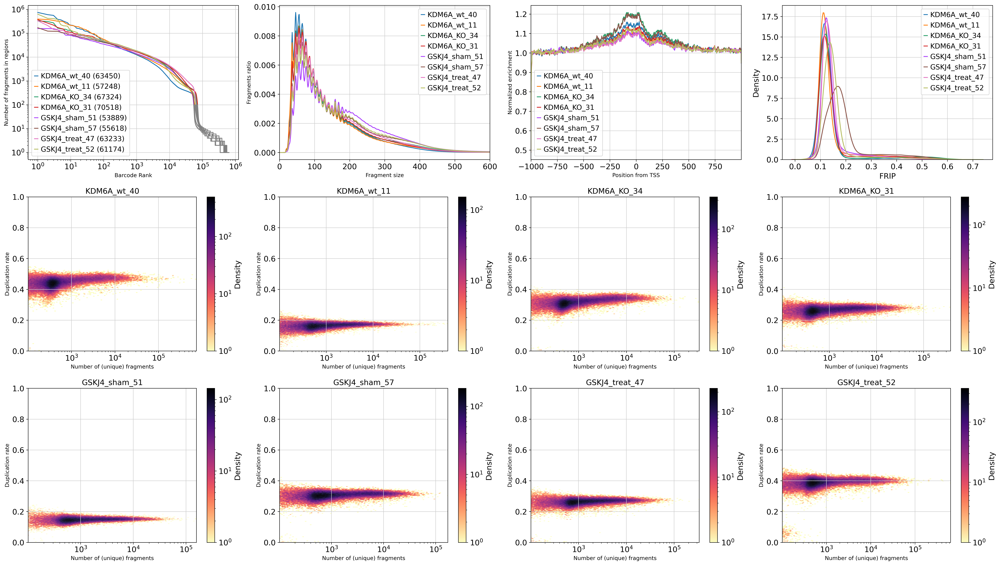

In [23]:
plot_sample_metrics(profile_data_dict,
           insert_size_distribution_xlim = [0,600],
           ncol = 4,
           plot = True,
           save = save_dir + '/quality_control/sample_metrics.pdf',
           duplicate_rate_as_hexbin = True)

### Visualise per-barcode level QC metrics

In [22]:
FRIP_NR_FRAG_fig = {}
FRIP_NR_FRAG_filter = {}
TSS_NR_FRAG_fig = {}
TSS_NR_FRAG_filter = {}
DR_NR_FRAG_fig = {}
for sample in metadata_bc.keys():
    FRIP_NR_FRAG_fig[sample], FRIP_NR_FRAG_filter[sample] = plot_barcode_metrics(metadata_bc[sample],
                                           var_x = 'Log_unique_nr_frag',
                                           var_y = 'FRIP',
                                           min_x = 3,
                                           max_x = None,
                                           min_y = 0.4,
                                           max_y = None,
                                           return_cells = True,
                                           return_fig = True,
                                           plot = False,
                                           save = save_dir + 'quality_control/barcode_metrics_FRIP-VS-NRFRAG_'+ sample +'.pdf')
    
    # Return figure to plot together with other metrics, and cells passing filters
    
    TSS_NR_FRAG_fig[sample], TSS_NR_FRAG_filter[sample]=plot_barcode_metrics(metadata_bc[sample],
                                          var_x = 'Log_unique_nr_frag',
                                          var_y = 'TSS_enrichment',
                                          min_x = 3,
                                          max_x = None,
                                          min_y = 4,
                                          max_y = None,
                                          return_cells = True,
                                          return_fig = True,
                                          plot = False,
                                          save = save_dir + 'quality_control/barcode_metrics_TSS-VS-NRFRAG_' + sample + '.pdf')
    
    # Return figure to plot together with other metrics, but not returning cells (no filter applied for the duplication rate  per barcode)
    
    DR_NR_FRAG_fig[sample]=plot_barcode_metrics(metadata_bc[sample],
                                          var_x = 'Log_unique_nr_frag',
                                          var_y = 'Dupl_rate',
                                          min_x = 3,
                                          max_x = None,
                                          min_y = None,
                                          max_y = None,
                                          return_cells = False,
                                          return_fig = True,
                                          plot = False,
                                          plot_as_hexbin = True)

In [24]:
fig = plt.figure(figsize = (20, 40))
i = 1
for sample in FRIP_NR_FRAG_fig.keys():
    plt.subplot(8, 3, i)
    plt.gca().set_title(sample, fontsize = 15)
    i += 1
    img = fig2img(FRIP_NR_FRAG_fig[sample]) #To convert figures to png to plot together, see .utils.py. This converts the figure to png.
    plt.imshow(img)
    plt.axis('off')
    plt.subplot(8, 3, i)
    plt.gca().set_title(sample, fontsize = 15)
    i += 1
    img = fig2img(TSS_NR_FRAG_fig[sample])
    plt.imshow(img)
    plt.axis('off')
    plt.subplot(8, 3, i)
    plt.gca().set_title(sample, fontsize = 15)
    i += 1
    img = fig2img(DR_NR_FRAG_fig[sample])
    plt.imshow(img)
    plt.axis('off')
plt.savefig(save_dir + 'quality_control/combined_qc.pdf')

### Perform filtering based on cells that passed QC

In [ ]:
sel_cells_dict = {}
for sample in FRIP_NR_FRAG_filter.keys():
    sel_cells_dict[sample] = list((set(FRIP_NR_FRAG_filter[sample]) & set(TSS_NR_FRAG_filter[sample])))

In [ ]:
sel_cells_dict

In [ ]:
                         #[min,  #max]
QC_filters = {
    'Log_unique_nr_frag': [1 , None],
    'FRIP':               [0.1, None],
    'TSS_enrichment':     [1   , None],
    'Dupl_rate':          [None, None]

}

In [ ]:
FRIP_NR_FRAG_fig, FRIP_NR_FRAG_filter=plot_barcode_metrics(metadata_bc['GSKJ4_treat_52'],
                                       var_x='Log_unique_nr_frag',
                                       var_y='FRIP',
                                       min_x=QC_filters['Log_unique_nr_frag'][0],
                                       max_x=QC_filters['Log_unique_nr_frag'][1],
                                       min_y=QC_filters['FRIP'][0],
                                       max_y=QC_filters['FRIP'][1],
                                       return_cells=True,
                                       return_fig=True,
                                       plot=False)

TSS_NR_FRAG_fig, TSS_NR_FRAG_filter=plot_barcode_metrics(metadata_bc['GSKJ4_treat_52'],
                                      var_x='Log_unique_nr_frag',
                                      var_y='TSS_enrichment',
                                      min_x=QC_filters['Log_unique_nr_frag'][0],
                                      max_x=QC_filters['Log_unique_nr_frag'][1],
                                      min_y=QC_filters['TSS_enrichment'][0],
                                      max_y=QC_filters['TSS_enrichment'][1],
                                      return_cells=True,
                                      return_fig=True,
                                      plot=False)

DR_NR_FRAG_fig=plot_barcode_metrics(metadata_bc['GSKJ4_treat_52'],
                                      var_x='Log_unique_nr_frag',
                                      var_y='Dupl_rate',
                                      min_x=QC_filters['Log_unique_nr_frag'][0],
                                      max_x=QC_filters['Log_unique_nr_frag'][1],
                                      min_y=QC_filters['Dupl_rate'][0],
                                      max_y=QC_filters['Dupl_rate'][1],
                                      return_cells=False,
                                      return_fig=True,
                                      plot=False,
                                      plot_as_hexbin = True)


In [ ]:
fig=plt.figure(figsize=(10,10))
plt.subplot(1, 3, 1)
img = fig2img(FRIP_NR_FRAG_fig)
plt.imshow(img)
plt.axis('off')
plt.subplot(1, 3, 2)
img = fig2img(TSS_NR_FRAG_fig)
plt.imshow(img)
plt.axis('off')
plt.subplot(1, 3, 3)
img = fig2img(DR_NR_FRAG_fig)
plt.imshow(img)
plt.axis('off')
plt.show()

### Export filtered barcodes

In [ ]:
bc_passing_filters = {'GSKJ4_treat_52':[]}
bc_passing_filters['GSKJ4_treat_52'] = list((set(FRIP_NR_FRAG_filter) & set(TSS_NR_FRAG_filter)))
pickle.dump(bc_passing_filters,
            open(os.path.join(save_dir, '/consensus_peak_calling/quality_control/GSKJ4_treat_52_bc_passing_filters.pkl'), 'wb'))
print(f"{len(bc_passing_filters['GSKJ4_treat_52'])} barcodes passed QC stats")

### Creating a cisTopic object and topic modeling

In [ ]:
scRNA_bc = heart_gex.obs_names

In [ ]:
bc_passing_filters = {'KDM6A_wt_40': pickle.load(open(os.path.join(save_dir, '/consensus_peak_calling/quality_control/KDM6A_wt_40_bc_passing_filters.pkl'), 'rb')), 
                  'KDM6A_wt_11': pickle.load(open(os.path.join(save_dir, '/consensus_peak_calling/quality_control/KDM6A_wt_11_bc_passing_filters.pkl'), 'rb')),
                  'KDM6A_KO_34': pickle.load(open(os.path.join(save_dir, '/consensus_peak_calling/quality_control/KDM6A_KO_34_bc_passing_filters.pkl'), 'rb')),
                  'KDM6A_KO_31': pickle.load(open(os.path.join(save_dir, '/consensus_peak_calling/quality_control/KDM6A_KO_31_bc_passing_filters.pkl'), 'rb')),
                  'GSKJ4_sham_51': pickle.load(open(os.path.join(save_dir, '/consensus_peak_calling/quality_control/GSKJ4_sham_51_bc_passing_filters.pkl'), 'rb')),
                  'GSKJ4_sham_57': pickle.load(open(os.path.join(save_dir, '/consensus_peak_calling/quality_control/GSKJ4_sham_57_bc_passing_filters.pkl'), 'rb')),
                  'GSKJ4_treat_47': pickle.load(open(os.path.join(save_dir, '/consensus_peak_calling/quality_control/GSKJ4_treat_47_bc_passing_filters.pkl'), 'rb')),
                  'GSKJ4_treat_52': pickle.load(open(os.path.join(save_dir, '/consensus_peak_calling/quality_control/GSKJ4_treat_52_bc_passing_filters.pkl'), 'rb'))}

In [ ]:
bc_passing_filters['KDM6A_wt_11']

In [ ]:
print(f"{len(list(set(bc_passing_filters['KDM6A_wt_11']) & set(scRNA_bc)))} cell barcodes pass both scATAC-seq and scRNA-seq based filtering")

In [ ]:
key = 'KDM6A_wt_11'
cistopic_obj = create_cistopic_object_from_fragments(
                            path_to_fragments = fragments_dict[key],
                            path_to_regions = path_to_regions[key],
                            path_to_blacklist = path_to_blacklist,
                            metrics = metadata_bc[key],
#                            valid_bc=list(set(bc_passing_filters[key]) & set(scRNA_bc)),
                            n_cpu = 24,
                            project = key,
                            split_pattern = '-')
cistopic_obj.add_cell_data(cell_data, split_pattern = '-')
print(cistopic_obj)

pickle.dump(cistopic_obj,
            open(os.path.join(save_dir, '/KDM6A_wt_11_cistobj.pkl'), 'wb'))

In [ ]:
key = 'KDM6A_KO_34'
cistopic_obj = create_cistopic_object_from_fragments(
                            path_to_fragments = fragments_dict[key],
                            path_to_regions = path_to_regions[key],
                            path_to_blacklist = path_to_blacklist,
                            metrics = metadata_bc[key],
#                            valid_bc=list(set(bc_passing_filters[key]) & set(scRNA_bc)),
                            n_cpu = 24,
                            project = key,
                            split_pattern = '-')
cistopic_obj.add_cell_data(cell_data, split_pattern = '-')
print(cistopic_obj)

pickle.dump(cistopic_obj,
            open(os.path.join(save_dir, '/KDM6A_KO_34_cistobj.pkl'), 'wb'))

In [ ]:
key = 'KDM6A_wt_40'
cistopic_obj = create_cistopic_object_from_fragments(
                            path_to_fragments = fragments_dict[key],
                            path_to_regions = path_to_regions[key],
                            path_to_blacklist = path_to_blacklist,
                            metrics = metadata_bc[key],
#                            valid_bc=list(set(bc_passing_filters[key]) & set(scRNA_bc)),
                            n_cpu = 24,
                            project = key,
                            split_pattern = '-')
cistopic_obj.add_cell_data(cell_data, split_pattern = '-')
print(cistopic_obj)

pickle.dump(cistopic_obj,
            open(os.path.join(save_dir, '/KDM6A_wt_40_cistobj.pkl'), 'wb'))

In [ ]:
key = 'KDM6A_KO_31'
cistopic_obj = create_cistopic_object_from_fragments(
                            path_to_fragments = fragments_dict[key],
                            path_to_regions = path_to_regions[key],
                            path_to_blacklist = path_to_blacklist,
                            metrics = metadata_bc[key],
#                            valid_bc=list(set(bc_passing_filters[key]) & set(scRNA_bc)),
                            n_cpu = 24,
                            project = key,
                            split_pattern = '-')
cistopic_obj.add_cell_data(cell_data, split_pattern = '-')
print(cistopic_obj)

pickle.dump(cistopic_obj,
            open(os.path.join(save_dir, '/KDM6A_KO_31_cistobj.pkl'), 'wb'))

In [ ]:
key = 'GSKJ4_sham_51'
cistopic_obj = create_cistopic_object_from_fragments(
                            path_to_fragments = fragments_dict[key],
                            path_to_regions = path_to_regions[key],
                            path_to_blacklist = path_to_blacklist,
                            metrics = metadata_bc[key],
#                            valid_bc=list(set(bc_passing_filters[key]) & set(scRNA_bc)),
                            n_cpu = 24,
                            project = key,
                            split_pattern = '-')
cistopic_obj.add_cell_data(cell_data, split_pattern = '-')
print(cistopic_obj)

pickle.dump(cistopic_obj,
            open(os.path.join(save_dir, '/GSKJ4_sham_51_cistobj.pkl'), 'wb'))

In [ ]:
key = 'GSKJ4_sham_57'
cistopic_obj = create_cistopic_object_from_fragments(
                            path_to_fragments = fragments_dict[key],
                            path_to_regions = path_to_regions[key],
                            path_to_blacklist = path_to_blacklist,
                            metrics = metadata_bc[key],
#                            valid_bc=list(set(bc_passing_filters[key]) & set(scRNA_bc)),
                            n_cpu = 24,
                            project = key,
                            split_pattern = '-')
cistopic_obj.add_cell_data(cell_data, split_pattern = '-')
print(cistopic_obj)

pickle.dump(cistopic_obj,
            open(os.path.join(save_dir, '/GSKJ4_sham_57_cistobj.pkl'), 'wb'))

In [ ]:
key = 'GSKJ4_treat_47'
cistopic_obj = create_cistopic_object_from_fragments(
                            path_to_fragments = fragments_dict[key],
                            path_to_regions = path_to_regions[key],
                            path_to_blacklist = path_to_blacklist,
                            metrics = metadata_bc[key],
#                            valid_bc=list(set(bc_passing_filters[key]) & set(scRNA_bc)),
                            n_cpu = 24,
                            project = key,
                            split_pattern = '-')
cistopic_obj.add_cell_data(cell_data, split_pattern = '-')
print(cistopic_obj)

pickle.dump(cistopic_obj,
            open(os.path.join(save_dir, '/GSKJ4_treat_47_cistobj.pkl'), 'wb'))

In [ ]:
key = 'GSKJ4_treat_52'
cistopic_obj = create_cistopic_object_from_fragments(
                            path_to_fragments = fragments_dict[key],
                            path_to_regions = path_to_regions[key],
                            path_to_blacklist = path_to_blacklist,
                            metrics = metadata_bc[key],
#                            valid_bc=list(set(bc_passing_filters[key]) & set(scRNA_bc)),
                            n_cpu = 24,
                            project = key,
                            split_pattern = '-')
cistopic_obj.add_cell_data(cell_data, split_pattern = '-')
print(cistopic_obj)

pickle.dump(cistopic_obj,
            open(os.path.join(save_dir, '/GSKJ4_treat_52_cistobj.pkl'), 'wb'))